In [188]:
import pickle
import os
import numpy as np
import mdtraj
import deeptime
import glob
import matplotlib.pyplot as plt
from tqdm import tqdm

In [189]:
from westpa_helpers import *

In [190]:
current_directory = os.getcwd()

In [191]:
FPS=10 # FPS for movie
protein_name = "homeodomain"

In [192]:
# Change this to the root of the run
home_path=f"/media/DATA_18_TB_1/awaghili/WESTPA_CG/mabbin_1d_harmonic_mix_{protein_name}/westpa_prop"
os.chdir(home_path)

sim_config = extract_simulation_config()


# Will be needed to unpickle the TICA models
import sys
sys.path.append(sim_config['cgschnet_path'])

In [193]:
# Define any additional coordinate files, such as the ground truth
coordinate_files = [
    f"/media/DATA_14_TB/daniel_s/cg_all_benchmark_finetuneE01_s4/{protein_name}*/raw/coordinates.npy",
]


In [194]:
import re

def extract_number(filename):
    match = re.search(fr'{protein_name}_(\d+)\.h5', filename)
    return int(match.group(1)) if match else float('inf') 


# Expand the glob pattern into a list
expanded_files = sorted(glob.glob(
    home_path + "/combined_trajs/*.h5" #Change this to *_all.h5 if you only want the final result
), key=extract_number)

# Append the matched files to the coordinate_files list
coordinate_files.extend(expanded_files)

In [196]:
model = load_tica_model(sim_config["tica_model_path"])
coordinate_list, label_list = load_trajectories(coordinate_files, size_limit=1000000)

 18%|█▊        | 302/1669 [00:23<01:33, 14.69it/s]


 36%|███▌      | 604/1669 [00:47<01:29, 11.94it/s]


 54%|█████▍    | 906/1669 [01:10<00:58, 13.13it/s]


 72%|███████▏  | 1204/1669 [01:33<00:36, 12.65it/s]


 90%|████████▉ | 1500/1669 [01:56<00:13, 12.42it/s]


  0%|          | 0/1 [00:00<?, ?it/s]/home/md-ml/miniconda3/envs/andy-reports-3/lib/python3.11/site-packages/mdtraj/core/trajectory.py:441: UserWarning: top= kwargs ignored since this file parser does not support it
  warnings.warn("top= kwargs ignored since this file parser does not support it")
100%|██████████| 1/1 [00:00<00:00, 141.03it/s]

100%|██████████| 1/1 [00:00<00:00, 163.53it/s]

100%|██████████| 1/1 [00:00<00:00, 164.33it/s]

100%|██████████| 1/1 [00:00<00:00, 143.11it/s]

100%|██████████| 1/1 [00:00<00:00, 122.78it/s]

100%|██████████| 1/1 [00:00<00:00, 109.88it/s]

100%|██████████| 1/1 [00:00<00:00, 85.61it/s]

100%|██████████| 1/1 [00:00<00:00, 87.37it/s]

100%|██████████| 1/1 [00:00<00:00, 74.12it/s]

100%|██████████| 1/1 [00:00<00:00, 67.52it/s]

100%|██████████| 1/1 [00:00<00:00, 64.90it/s]

100%|██████████| 1/1 [00:00<00:00, 62.53it/s]

100%|██████████| 1/1 [00:00<00:00, 56.61it/s]

100%|██████████| 1/1 [00:00<00:00, 52.67it/s]

100%|██████████| 1/1 [00:00<00:00, 50.

100%|██████████| 1/1 [00:00<00:00, 15.12it/s]

100%|██████████| 1/1 [00:00<00:00, 14.55it/s]

100%|██████████| 1/1 [00:00<00:00, 14.61it/s]

100%|██████████| 1/1 [00:00<00:00, 13.94it/s]

100%|██████████| 1/1 [00:00<00:00, 13.99it/s]

100%|██████████| 1/1 [00:00<00:00, 14.08it/s]

100%|██████████| 1/1 [00:00<00:00, 13.33it/s]

100%|██████████| 1/1 [00:00<00:00, 12.63it/s]

100%|██████████| 1/1 [00:00<00:00, 12.31it/s]

100%|██████████| 1/1 [00:00<00:00, 12.01it/s]

100%|██████████| 1/1 [00:00<00:00, 10.91it/s]

100%|██████████| 1/1 [00:00<00:00, 11.32it/s]

100%|██████████| 1/1 [00:00<00:00, 11.11it/s]

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

100%|██████████| 1/1 [00:00<00:00, 10.40it/s]

100%|██████████| 1/1 [00:00<00:00,  7.04it/s]


 86%|████████▌ | 191/222 [06:25<00:06,  5.02it/s]


100%|██████████| 222/222 [06:32<00:00,  1.77s/it]


In [ ]:
a = [coordinate_list[0]]
temp = [coordinate_list[0]]
coordinate_files = []
coordinate_files.extend(expanded_files)
coordinate_updated, label_updated = load_trajectories(coordinate_files, size_limit=1000000)
temp.extend(coordinate_updated)
coordinate_list = temp
print(coordinate_list)

In [197]:
components_to_calculate = range(2) # Number of components to calculate
tica_plot_pad = 0.2

kB = 0.0019872041 # kcal/mol/Kelvin
Temp = 300 # Kelvin

In [198]:
component_values = [calculate_component_values(model, c, components_to_calculate) for c in tqdm(coordinate_list)]
component_values[0].keys(), [[len(v) for v in c.values()] for c in component_values]

component_maxs = [max([max(c[tica_comp]) for c in component_values]) for tica_comp in components_to_calculate]
component_mins = [min([min(c[tica_comp]) for c in component_values]) for tica_comp in components_to_calculate]
component_range = [*zip(component_mins, component_maxs)]

100%|██████████| 222/222 [03:48<00:00,  1.03s/it]


In [199]:
histogram_range = np.array([[component_range[0][0] - tica_plot_pad, component_range[0][1] + tica_plot_pad],
                            [component_range[1][0] - tica_plot_pad, component_range[1][1] + tica_plot_pad]])
num_contour_levels = 6

## Plots
1. List of all figures in sequence
2. Movie creation (saved as density_movie.mp4)
3. Side-by-Side Comparison (Best used for smaller # of plots like 2 or 3)
4. Same as 3 but with different threshold and coloring

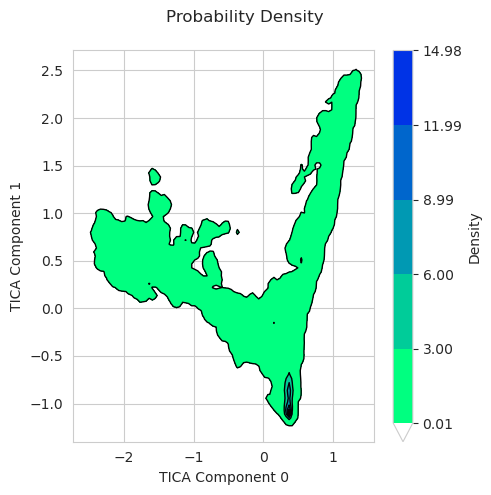

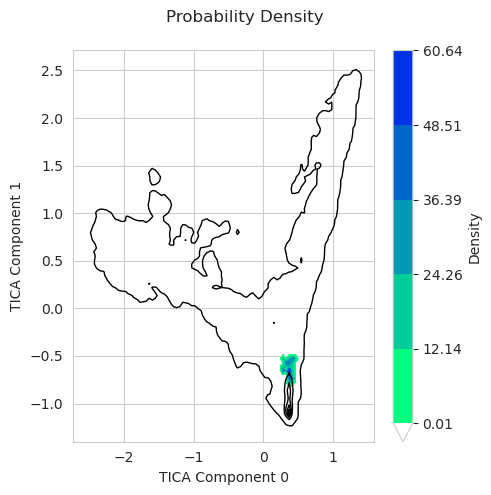

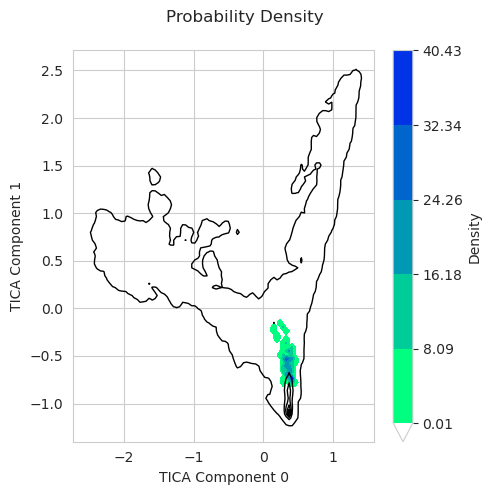

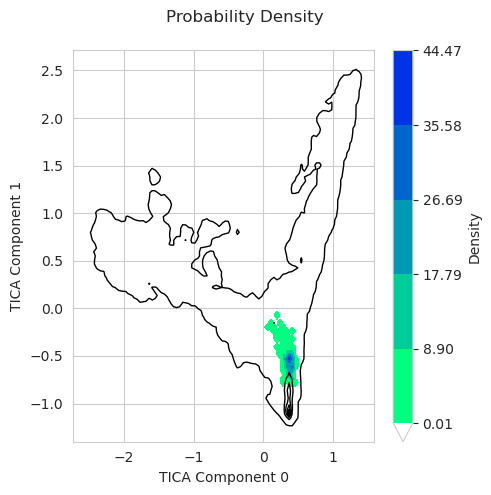

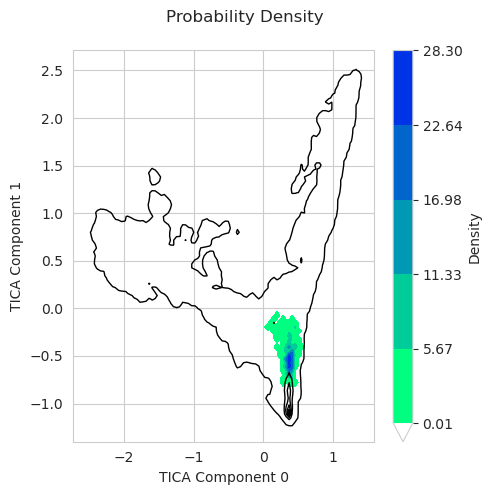

...

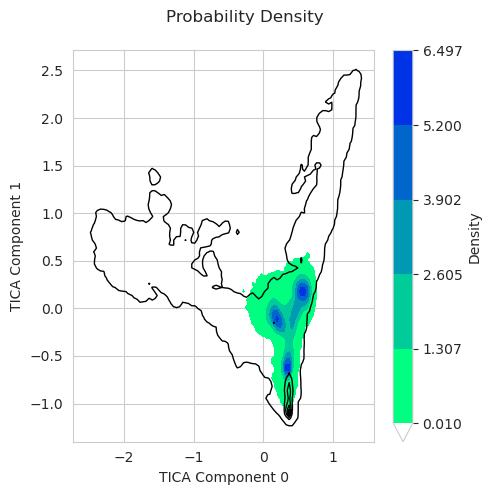

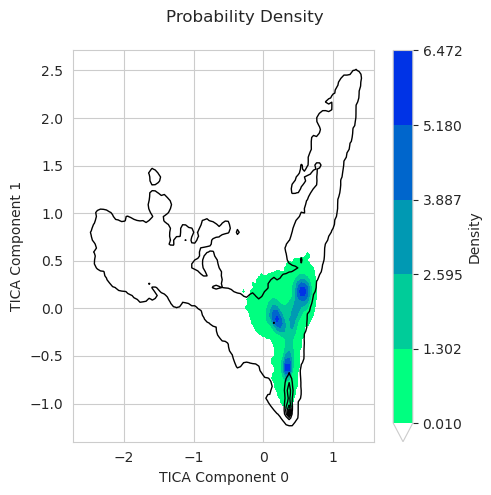

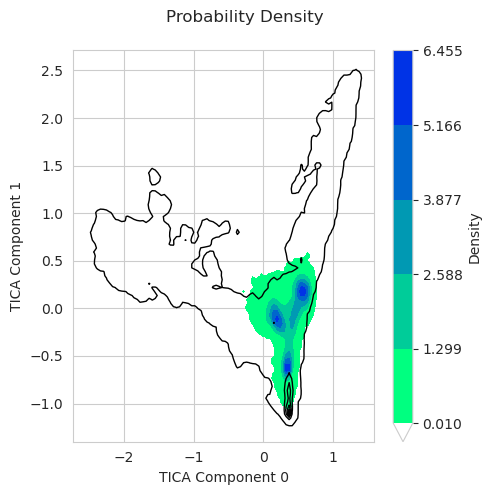

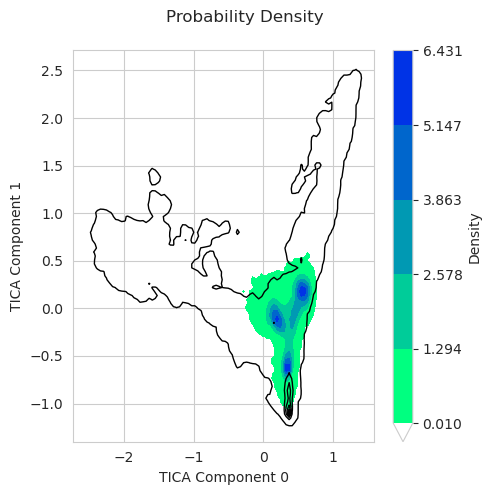

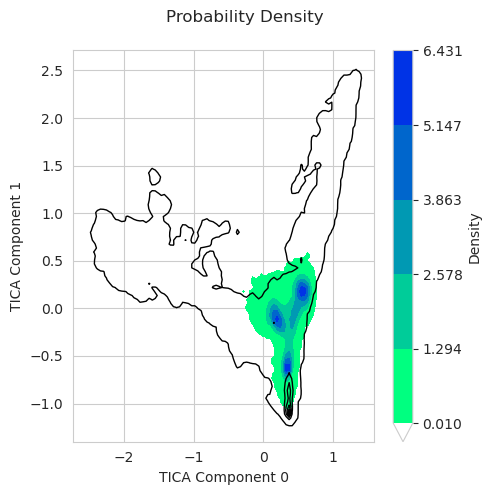

In [200]:
for i in range(len(coordinate_list)):
    fig, ax = plt.subplots(figsize=(5, 5))  # Create a new figure for each plot

    hist2d, xedges, yedges = np.histogram2d(
        component_values[i][0],
        component_values[i][1],
        bins=(100, 100),
        range=histogram_range,
        density=True,
    )

    max_density = np.max(hist2d)
    if max_density <= 0.01:
        levels = np.linspace(0.001, 0.01, num_contour_levels)
    else:
        levels = np.linspace(0.01, round(max_density * 1.1, 3), num_contour_levels)

    if i == 0:
        hist_ref = hist2d
        levels_ref = levels

    contour = ax.contourf(
        hist2d.T,
        origin='lower',
        extent=histogram_range.flatten(),
        levels=levels,
        extend='min',
        colors=[(0.0, 0.0, 0.0, 0.0)] + [plt.cm.winter_r(j / (len(levels) - 1)) for j in range(len(levels) - 1)],
    )

    ax.contour(
        hist_ref.T,
        origin='lower',
        extent=histogram_range.flatten(),
        levels=levels_ref,
        colors="black",
        linewidths=1,
        linestyles="-"
    )

    ax.set_xlabel('TICA Component 0')
    ax.set_ylabel('TICA Component 1')
    fig.colorbar(contour, ax=ax, label='Density')
#     ax.set_title(shorten_label(label_list[i], 50))

    fig.suptitle("Probability Density")
    plt.tight_layout()
    plt.show()


2025-06-08 13:19:53,644 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-06-08 13:19:53,644 - matplotlib.animation - INFO - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 500x500 -pix_fmt rgba -framerate 10 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /media/DATA_18_TB_1/awaghili/WESTPA_CG/mabbin_2_harmonic_mix_homeodomain/westpa_prop/density_movie.mp4


/media/DATA_18_TB_1/awaghili/WESTPA_CG/mabbin_2_harmonic_mix_homeodomain/westpa_prop


/tmp/ipykernel_2162098/1437908216.py:69: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  return contour.collections


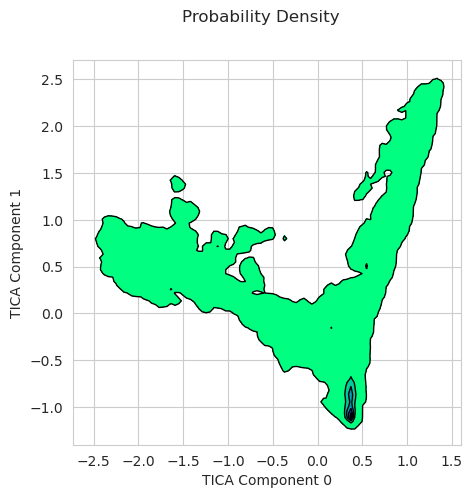

In [201]:
# Movie

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

fig, ax = plt.subplots(figsize=(5, 5))

# Prepare the first frame manually
hist_ref = None
levels_ref = None

# Store all 2D histograms and levels ahead of time
histograms = []
levels_list = []

for i in range(len(coordinate_list)):
    hist2d, xedges, yedges = np.histogram2d(
        component_values[i][0],
        component_values[i][1],
        bins=(100, 100),
        range=histogram_range,
        density=True,
    )

    max_density = np.max(hist2d)
    if max_density <= 0.01:
        levels = np.linspace(0.001, 0.01, num_contour_levels)
    else:
        levels = np.linspace(0.01, round(max_density * 1.1, 3), num_contour_levels)

    histograms.append(hist2d)
    levels_list.append(levels)

    if i == 0:
        hist_ref = hist2d
        levels_ref = levels

# Function to update the frame
def update(i):
    ax.clear()

    hist2d = histograms[i]
    levels = levels_list[i]

    contour = ax.contourf(
        hist2d.T,
        origin='lower',
        extent=histogram_range.flatten(),
        levels=levels,
        extend='min',
        colors=[(0.0, 0.0, 0.0, 0.0)] + [plt.cm.winter_r(j / (len(levels) - 1)) for j in range(len(levels) - 1)],
    )

    ax.contour(
        hist_ref.T,
        origin='lower',
        extent=histogram_range.flatten(),
        levels=levels_ref,
        colors="black",
        linewidths=1,
        linestyles="-"
    )

    ax.set_xlabel('TICA Component 0')
    ax.set_ylabel('TICA Component 1')
#     ax.set_title(shorten_label(label_list[i], 50))
    fig.suptitle("Probability Density")
    return contour.collections

# Create animation
ani = animation.FuncAnimation(
    fig, update, frames=len(coordinate_list), blit=False
)

print(current_directory)
# Save animation to file
ani.save(current_directory + "/density_movie.mp4", writer='ffmpeg', fps=FPS)  # Adjust `fps` as needed


In [202]:
histogram_range = np.array([[component_range[0][0] - tica_plot_pad, component_range[0][1] + tica_plot_pad],
                            [component_range[1][0] - tica_plot_pad, component_range[1][1] + tica_plot_pad]])
num_contour_levels = 6

# TODO: Use grid function from bond/angle notebook
fig, axes = plt.subplots(1, len(coordinate_list), figsize=(5*len(coordinate_list), 5))
if len(coordinate_list) == 1:
    axes = [axes]
hist_ref = None
levels_ref = None

for i in range(len(coordinate_list)):
    hist2d, xedges, yedges = np.histogram2d(
        component_values[i][0],
        component_values[i][1],
        bins=(100, 100),
        range=histogram_range,
        density=True,
    )

#     levels = np.linspace(0.01, round(np.max(hist2d)*1.1, 1), num_contour_levels)

    max_density = np.max(hist2d)
    if max_density <= 0.01:
        levels = np.linspace(0.001, 0.01, num_contour_levels)  # fallback for low density
    else:
        levels = np.linspace(0.01, round(max_density * 1.1, 3), num_contour_levels)

    if hist_ref is None:
        hist_ref = hist2d
        levels_ref = levels


    contour1 = axes[i].contourf(hist2d.T, origin='lower', extent=histogram_range.flatten(), levels=levels, extend='min',
                                colors=[(0.0,0.0,0.0,0.0)]+[plt.cm.winter_r(i/(len(levels)-1)) for i in range(len(levels)-1)])
    axes[i].contour(hist_ref.T, origin='lower', extent=histogram_range.flatten(), levels=levels_ref, colors="black", linewidths=1, linestyles="-")
    axes[i].set_xlabel('TICA Component 0')
    axes[i].set_ylabel('TICA Component 1')
    fig.colorbar(contour1, ax=axes[i], label='Density')
    axes[i].set_title(shorten_label(label_list[i], 50))

fig.suptitle("Proability density")
plt.tight_layout()
plt.show()


ValueError: Image size of 111000x500 pixels is too large. It must be less than 2^16 in each direction.

Error in callback <function _draw_all_if_interactive at 0x7fcfeac468e0> (for post_execute), with arguments args (),kwargs {}:


ValueError: Image size of 111000x500 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 111000x500 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 111000x500 with 444 Axes>

In [ ]:

# TODO: Use grid function from bond/angle notebook
fig, axes = plt.subplots(1, len(coordinate_list), figsize=(5*len(coordinate_list), 5))
if len(coordinate_list) == 1:
    axes = [axes]
hist_ref = None

for i in range(len(coordinate_list)):
    hist2d, xedges, yedges = np.histogram2d(
        component_values[i][0],
        component_values[i][1],
        bins=(100, 100),
        range=histogram_range,
    )

    hist_log_mask = hist2d > 0
    hist2d[hist_log_mask] = -kB * Temp * np.log(hist2d[hist2d > 0])
    hist2d[~hist_log_mask] = 0.0000001 # The histograms look nicer if the undefined values are slightly more than zero

    levels=np.linspace(round(np.min(hist2d)*1.1, 1), 0, num_contour_levels)

    if hist_ref is None:
        hist_ref = hist2d
        levels_ref = levels

    contour1 = axes[i].contourf(hist2d.T, origin='lower', extent=histogram_range.flatten(), levels=levels, extend='max',
                                colors=[plt.cm.winter_r(i/(len(levels)-1)) for i in range(len(levels)-1)]+[(0.0,0.0,0.0,0.0)])
    axes[i].contour(hist_ref.T, origin='lower', extent=histogram_range.flatten(), levels=levels_ref, colors="black", linewidths=1, linestyles="-")
    axes[i].set_xlabel('TICA Component 0')
    axes[i].set_ylabel('TICA Component 1')
    fig.colorbar(contour1, ax=axes[i], label='Free energy (kca/mol)')
#     axes[i].set_title(shorten_label(label_list[i], 50))

plt.tight_layout()
plt.show()
